In [1]:
import numpyro
numpyro.enable_x64()
numpyro.set_platform("cpu")
numpyro.set_host_device_count(10)

import arviz as az
import numpy as np
import pandas as pd
import jax.numpy as jnp
from cycler import cycler
import matplotlib
import matplotlib.pyplot as plt
from jax import random, jit, lax, pmap, vmap
from corner import corner, overplot_points, overplot_lines
from numpyro import handlers
from numpyro.infer import MCMC, NUTS, init_to_uniform, init_to_feasible, Predictive, SVI, Trace_ELBO
from numpyro.infer.autoguide import AutoDelta, AutoBNAFNormal, AutoIAFNormal
from numpyro.optim import Adam
from eggman.infer import Star
from functools import partial

rng = random.PRNGKey(42)

Holoviews not imported. Some visualizations will not be available.
PyMultiNest not imported.  MultiNest fits will not work.
I0000 00:00:1701099397.488987 1557524 tfrt_cpu_pjrt_client.cc:349] TfrtCpuClient created.


In [2]:
dist = numpyro.distributions

In [3]:
class TrueStar(Star):
    max_distance = 500.  # parsecs
    max_av = 1.
    
    def prior(self, const):
        s = numpyro.sample("s", dist.Beta(2.0, 5.0))
        # ln_mass = numpyro.sample("ln_mass", LogSalpeter(jnp.log(0.7), jnp.log(2.3), rate=2.35))
        # Good approximation of Chabrier IMF
        ln_mass = numpyro.sample("ln_mass", dist.TruncatedNormal(-0.2, 0.7, low=jnp.log(0.7), high=jnp.log(2.3)))
        y = numpyro.sample("Y", dist.Uniform(0.22, 0.32))
        mh = numpyro.sample("M_H", dist.TruncatedNormal(0.0, 0.5, low=-0.9, high=0.5))
        a_mlt = numpyro.deterministic("a_MLT", 2.0)
        
        # This is the inverse of a Beta distribution where beta = 1
        # In particular, alpha = 3 is the inverse of a distance^2 distribution
        plx = numpyro.sample("plx", dist.Pareto(1/self.max_distance, 3.0))
        
        # This is just p(av) ~ av^(alpha - 1)
        av_scaled = numpyro.sample("Av_scaled", dist.Beta(2., 1.))
        av = numpyro.deterministic("Av", self.max_av * av_scaled)

        return s, ln_mass, mh, y, a_mlt, plx, av

In [4]:
num_stars = 10

true_model = TrueStar()
# true_model._x_bounds = jnp.array([0.0, 0.25, 0.5, 0.75, 1.0])
# true_model._eep_funclist = true_model._get_eep_funclist()

rng, key = random.split(rng)
pred = Predictive(true_model, num_samples=num_stars)
const = {}
truths = pred(key, const)

Beta dist with beta = 1 is just a bounded power law dist where the power is (alpha - 1)

In [6]:
from numpyro.distributions.util import clamp_probs

class TwoSidedTruncatedDistribution(dist.TwoSidedTruncatedDistribution):
    def icdf(self, u):
        loc = self.base_dist.loc
        sign = jnp.where(loc >= self.low, 1.0, -1.0)
        return (1 - sign) * loc + sign * self.base_dist.icdf(
            clamp_probs((1 - u) * self._tail_prob_at_low + u * self._tail_prob_at_high)
        )

def TruncatedNormal(loc=0.0, scale=1.0, *, low=None, high=None, validate_args=None):
    return TwoSidedTruncatedDistribution(
        dist.Normal(loc, scale), low=low, high=high, validate_args=validate_args
    )

In [7]:
from eggman.infer.models import lognorm_from_norm

class NewStar(Star):
#     _x_bounds = []
    def prior(self, const):
        x = numpyro.sample("x", dist.Uniform(0.0, 0.999))
#         x = numpyro.sample("x", TruncatedNormal(truths["x"][i], 0.01, low=0, high=1))
#         x = numpyro.sample("x", TruncatedNormal(0.5, 2.0, low=0.0, high=1.0))
        # ln_mass = numpyro.sample("ln_mass", LogSalpeter(jnp.log(0.7), jnp.log(2.3), rate=2.35))
        # Good approximation of Chabrier IMF
        ln_mass = numpyro.sample("ln_mass", TruncatedNormal(-0.2, 0.7, low=jnp.log(0.7), high=jnp.log(2.3)))
        
#         ln_mass = numpyro.deterministic("ln_mass", truths["ln_mass"][i])

#         ln_mass = numpyro.sample("ln_mass", TruncatedNormal(np.log(1.7), 0.4, low=jnp.log(0.7), high=jnp.log(2.3)))
#         ln_mass = numpyro.sample("ln_mass", dist.Uniform(0.7, 2.3))
#         ln_mass = jnp.log(ln_mass)

        y = numpyro.sample("Y", dist.Uniform(0.22, 0.32))
#         y = numpyro.deterministic("Y", truths["Y"][i])

#         y = numpyro.sample("Y", TruncatedNormal(0.26, 0.1, low=0.22, high=0.32))
        
        mh = numpyro.sample("M_H", TruncatedNormal(const["M_H"]["mu"], const["M_H"]["sigma"], low=-0.9, high=0.5))
#         mh = numpyro.deterministic("M_H", truths["M_H"][i])
        
        a_mlt = numpyro.sample("a_MLT", dist.Uniform(1.3, 2.7))
#         a_mlt = numpyro.sample("a_MLT", TruncatedNormal(2.0, 2.0, low=1.3, high=2.7))
#         a_mlt = numpyro.deterministic("a_MLT", truths["a_MLT"][i])
        
        plx_dist = dist.LogNormal(*lognorm_from_norm(const["plx"]["mu"], const["plx"]["sigma"]))
        plx = numpyro.sample("plx", plx_dist)

        av_dist = dist.LogNormal(*lognorm_from_norm(const["Av"]["mu"], const["Av"]["sigma"]))            
        av = numpyro.sample("Av", av_dist)

        return x, ln_mass, y, mh, a_mlt, plx, av

In [5]:
model = Star()
model.dof = 10

for band in model.bands:
    const[band] = dict(sigma=3e-3)

In [132]:
i = 3
const["M_H"] = dict(mu=truths["M_H"][i], sigma=0.1)
const["plx"] = dict(mu=truths["plx"][i], sigma=4e-5)
const["Av"] = dict(mu=truths["Av"][i], sigma=0.01*truths["Av"][i])
obs = {key: truths[key][i] for key in model.bands}

In [162]:
rng, key = random.split(rng)
prior_predictive = Predictive(model, num_samples=10000)
prior_samples = prior_predictive(key, const)

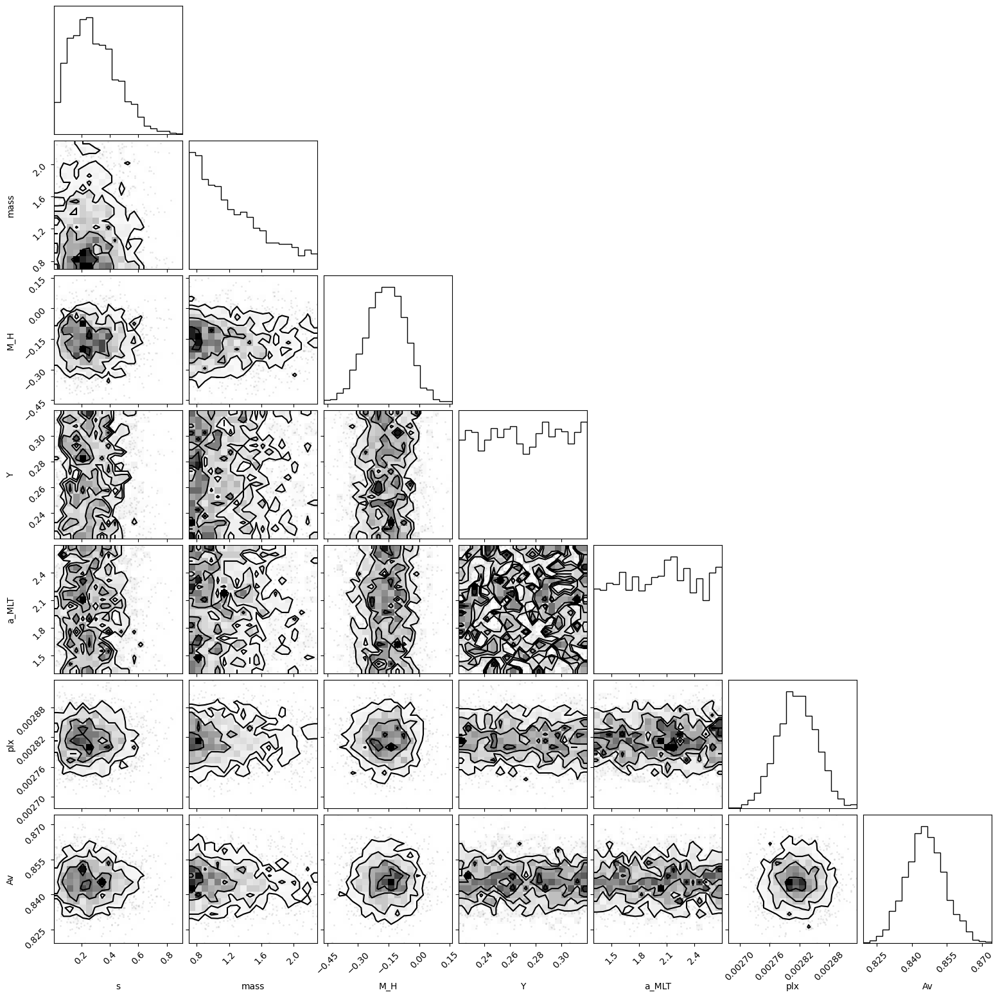

In [134]:
var_names = [
    "s", 
    "mass", 
    "M_H", 
    "Y", 
    "a_MLT", 
    "plx",
    "Av",
]
corner(prior_samples, var_names=var_names);

In [152]:
prior_samples.keys()

dict_keys(['Av', 'BP', 'BP_abs', 'Dnu', 'G', 'G_abs', 'M_H', 'RP', 'RP_abs', 'Teff', 'Y', 'Z', 'a_MLT', 'age', 'dist', 'ln_mass', 'log_age', 'log_lum', 'log_rad', 'logg', 'lum', 'mass', 'plx', 'rad', 's'])

In [163]:
mask = prior_samples["age"] < 14
young_samples = {k: v[mask] for k, v in prior_samples.items()}
old_samples = {k: v[~mask] for k, v in prior_samples.items()}

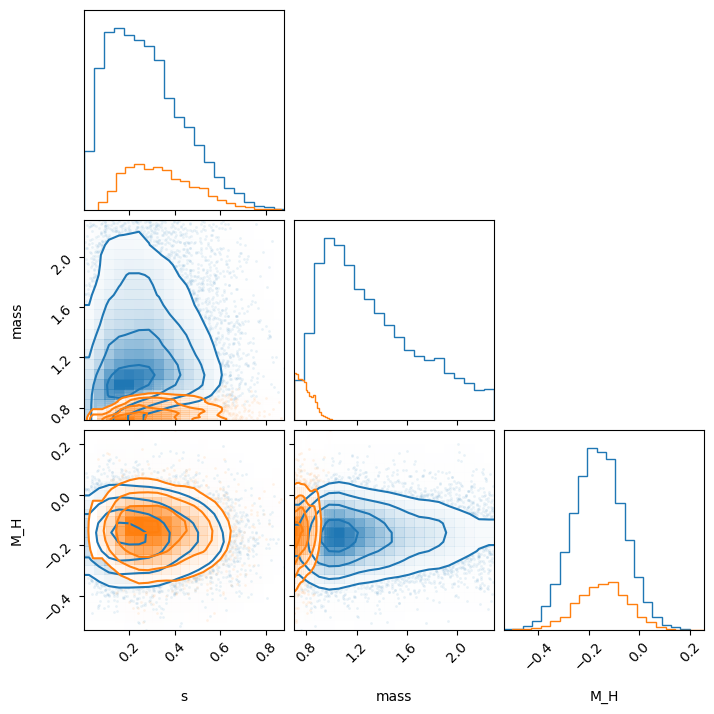

In [164]:
var_names = [
    "s", 
    "mass", 
    "M_H", 
]
fig = corner(young_samples, var_names=var_names, color="C0", smooth=1.)
fig = corner(old_samples, var_names=var_names, color="C1", fig=fig, smooth=1.)

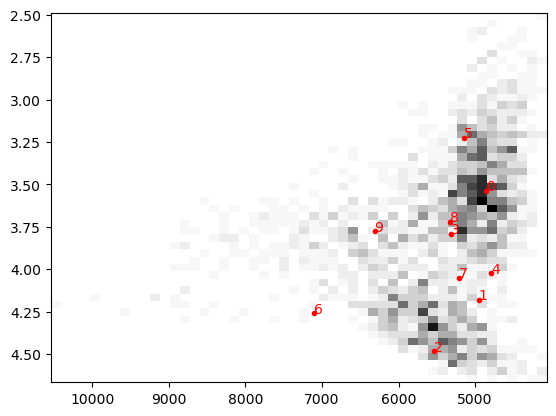

In [107]:
fig, ax = plt.subplots()
ax.hist2d(prior_samples["Teff"], prior_samples["logg"], bins=50, cmap="Greys")
ax.plot(truths["Teff"], truths["logg"], color="r", marker=".", ls="none")
for i, s in enumerate(map(str, range(num_stars))):
    ax.text(truths["Teff"][i], truths["logg"][i], s, color="r")
ax.invert_xaxis();
ax.invert_yaxis();

In [135]:
# num_steps = 5000
# num_chains = 10

# guide = AutoDelta(model, init_loc_fn=init_to_uniform)
# optim = Adam(step_size=0.01)
# loss = Trace_ELBO()

# svi = SVI(model, guide, optim, loss)

# run_svi = partial(svi.run, num_steps=num_steps, const=const, obs=obs, progress_bar=False)

In [136]:
# %%time
# keys = random.split(rng, num_chains+1)
# rng, key = keys[0], keys[1:]
# svi_result = pmap(run_svi)(key)

In [137]:
# fig, axes = plt.subplots(2, sharex=True)

# # cycle = matplotlib.rcParams["axes.prop_cycle"] * cycler(ls=["-", "--", "-.", ":"])
# cycle = cycler(ls=["-", "--", "-.", ":"])
# ylim = np.quantile(svi_result.losses, [0., .66])

# ax = axes[0]
# ax.set_prop_cycle(cycle)
# ax.plot(svi_result.losses.T)
# ax.axhspan(*ylim, alpha=0.33)
# ax.set_ylabel("loss")

# ax = axes[1]
# ax.set_prop_cycle(cycle)
# ax.plot(svi_result.losses.T)
# ax.set_ylim(ylim)
# ax.set_ylabel("loss")
# ax.set_xlabel("step")

# fig.tight_layout()

In [138]:
num_chains = 10
sampler = NUTS(model)
mcmc = MCMC(sampler, num_warmup=1000, num_samples=1000, num_chains=num_chains)

In [139]:
# rng, key = random.split(rng)

# # init_params = None
# init_params = {k[:-9]: v for k, v in svi_result.params.items()}
# # init_params = {k[:-9]: np.broadcast_to(truths[k[:-9]][i], (num_chains,)) for k, v in svi_result.params.items()}
# # init_params = {k[:-9]: np.broadcast_to(v[i_best], (num_chains,)) for k, v in svi_result.params.items()}

# extra_fields = ("adapt_state.step_size", "accept_prob", "num_steps")
# mcmc.warmup(key, const, extra_fields=extra_fields, collect_warmup=True, obs=obs, 
#             init_params=init_params)

In [140]:
# fields = mcmc.get_extra_fields(group_by_chain=True)
# step_size = fields["adapt_state.step_size"]
# accept_prob = fields["accept_prob"]
# num_steps = fields["num_steps"]
# tree_depth = np.log2(num_steps).astype(int) + 1.

In [141]:
# plt.plot(step_size.T)
# plt.yscale("log");

In [142]:
def polish_traceplot(fig, axes):
    for ax in axes[:, 0]:
        title = ax.get_title()
        ax.set_xlabel(title)
        ax.set_title(None)
    for ax in axes[:, 1]:
        title = ax.get_title()
        ax.set_xlabel("step")
        ax.set_ylabel(title)
        ax.set_title(None)

    fig = plt.gcf()
    fig.align_labels()
    fig.tight_layout() 
    return fig, axes

In [143]:
# var_names = [
#     "s", 
#     "mass", 
#     "M_H", 
#     "Y", 
#     "a_MLT", 
#     "plx",
#     "Av",
# ]
# backend_kwargs = {"tight_layout": True}

# axes = az.plot_trace(az.from_numpyro(mcmc), var_names=var_names, backend_kwargs=backend_kwargs)
# _ = polish_traceplot(plt.gcf(), axes)

In [144]:
rng, key = random.split(rng)
mcmc.run(key, const, 
        #  extra_fields=extra_fields, 
         obs=obs)
mcmc.print_summary()

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]


                mean       std    median      5.0%     95.0%     n_eff     r_hat
        Av      0.85      0.01      0.85      0.83      0.86   5794.89      1.00
       M_H     -0.18      0.10     -0.18     -0.35     -0.03   3145.41      1.00
         Y      0.28      0.03      0.28      0.24      0.32   3055.98      1.00
     a_MLT      2.28      0.36      2.40      1.67      2.70   2033.67      1.00
   ln_mass     -0.07      0.10     -0.06     -0.22      0.10   1474.47      1.00
       plx      0.00      0.00      0.00      0.00      0.00   5916.92      1.00
         s      0.31      0.04      0.30      0.24      0.38   1414.63      1.01

Number of divergences: 0


In [145]:
data = az.from_numpyro(mcmc)
data

Inference data with groups:
	> posterior
	> log_likelihood
	> sample_stats
	> observed_data

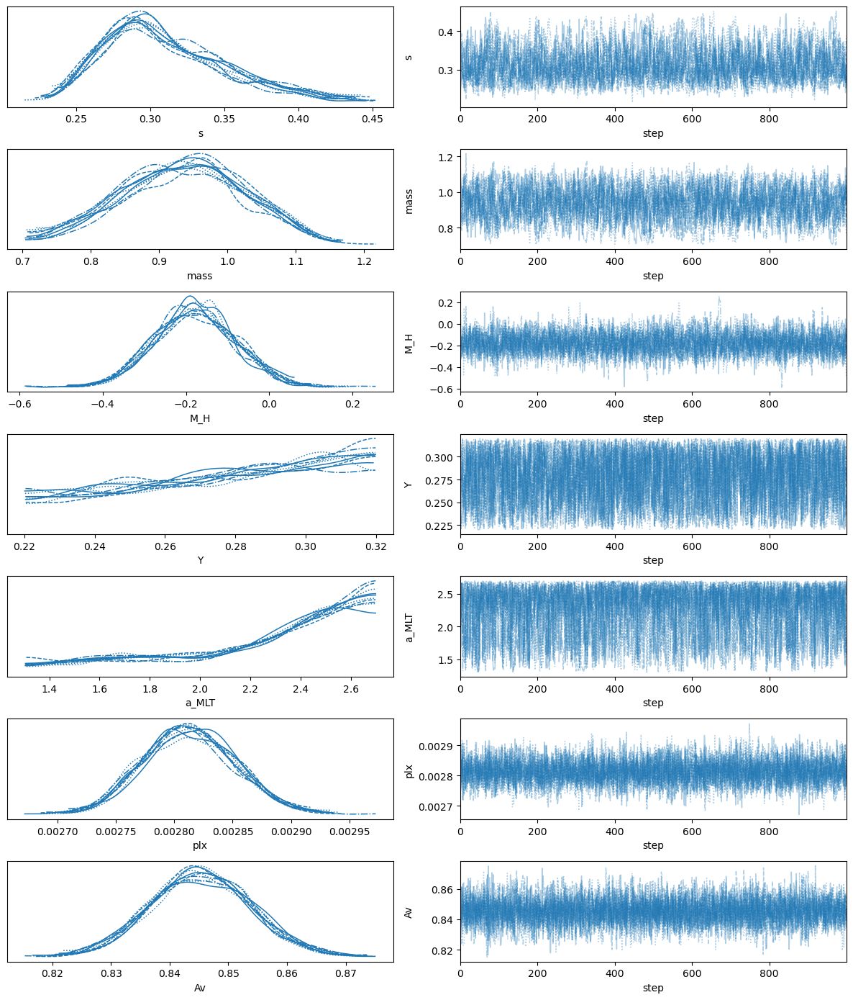

In [146]:
var_names = [
    "s", 
    "mass", 
    "M_H", 
    "Y", 
    "a_MLT", 
    "plx",
    "Av",
]
backend_kwargs = {"tight_layout": True}
axes = az.plot_trace(data, var_names=var_names, backend_kwargs=backend_kwargs)

_ = polish_traceplot(plt.gcf(), axes)

In [147]:
rng, key = random.split(rng)

predict = Predictive(model, posterior_samples=init_params)
init_params.update(predict(key, const, obs))

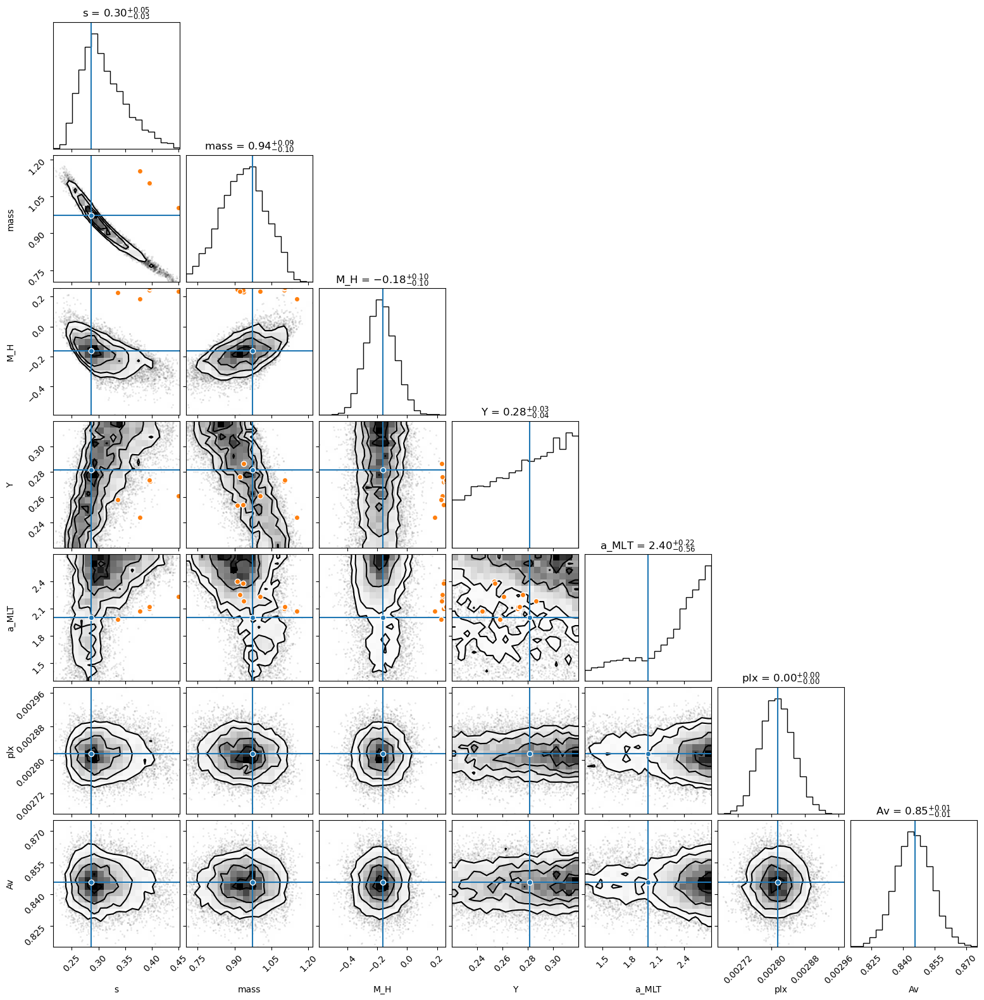

In [148]:
var_names = [
    "s", 
    "mass", 
    "M_H", 
    "Y",
    "a_MLT", 
    "plx",
    "Av",
]
divergences_kwargs = dict(c="C2", marker="o", markeredgecolor="white")

fig = corner(
    data, 
    var_names=var_names, 
    divergences=True,
    divergences_kwargs=divergences_kwargs,
    show_titles=True,
)

xs = np.array([truths[k][i] for k in var_names])
overplot_lines(fig, xs, c="C0")
overplot_points(fig, xs.reshape((1, -1)), c="C0", marker="o", markeredgecolor="white")

if init_params is not None:
    xs = np.stack([init_params[k] for k in var_names], 1)
    overplot_points(fig, xs, c="C1", marker="o", markeredgecolor="white")

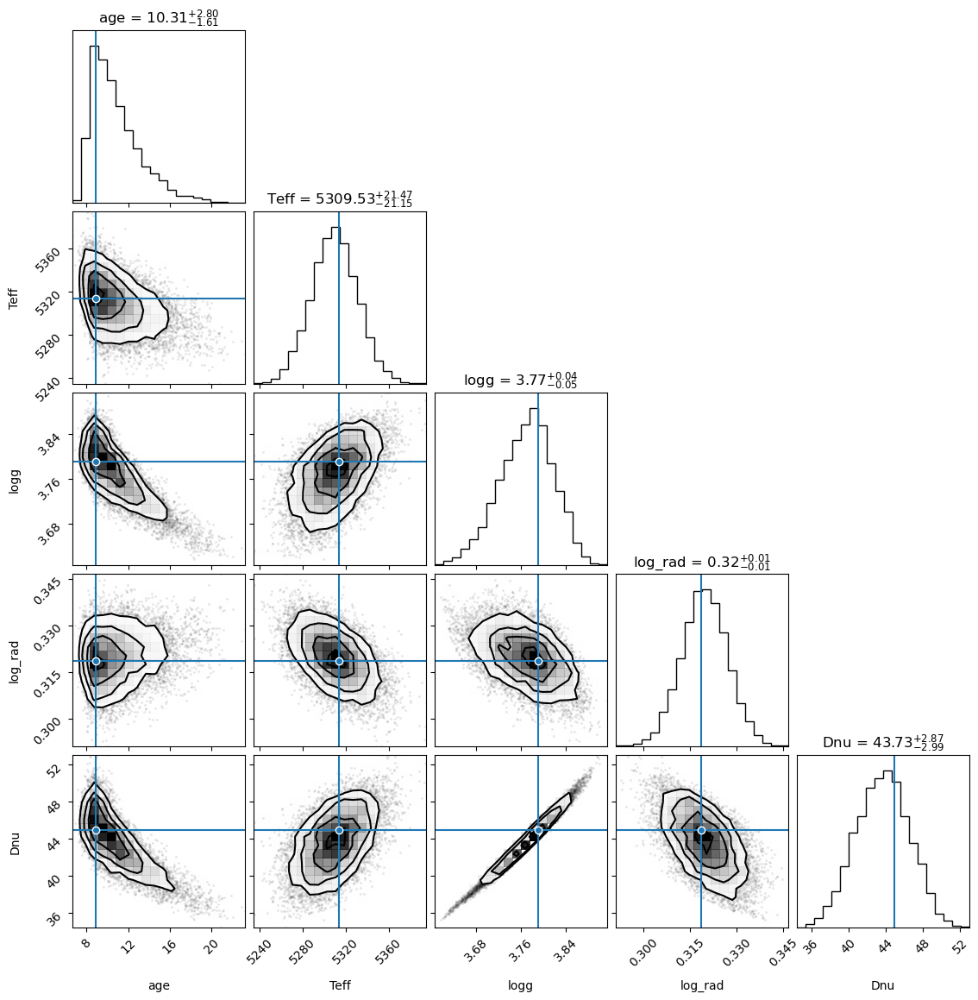

In [149]:
var_names = [
    "age", "Teff", "logg", "log_rad", "Dnu"
]

fig = corner(
    data, 
    var_names=var_names, 
    divergences=True,
    divergences_kwargs=divergences_kwargs,
    show_titles=True,
)

xs = np.array([truths[k][i] for k in var_names])
overplot_lines(fig, xs, c="C0")
overplot_points(fig, xs.reshape((1, -1)), c="C0", marker="o", markeredgecolor="white")

xs = np.stack([init_params[k] for k in var_names], 1)
overplot_points(fig, xs, c="C1", marker="o", markeredgecolor="white")

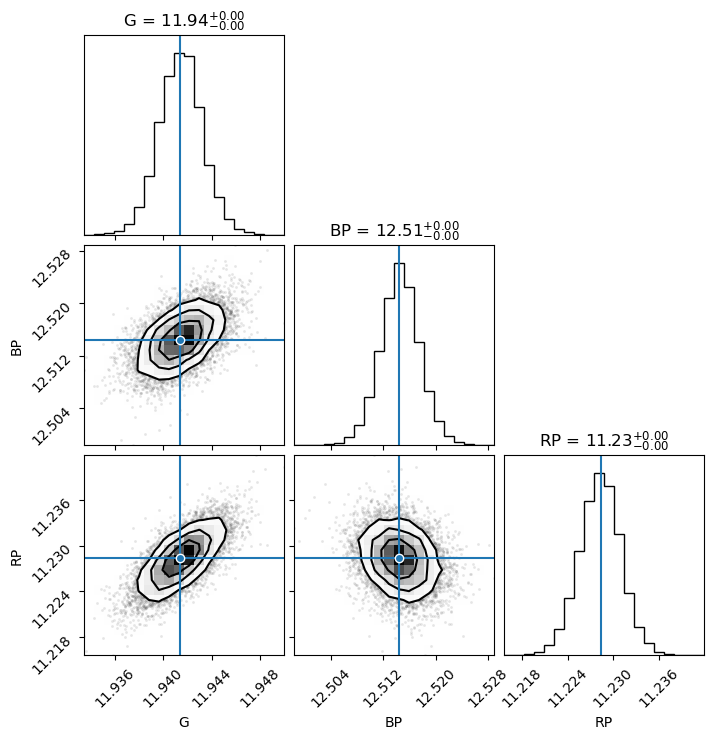

In [150]:
var_names = model.bands

fig = corner(
    data, 
    var_names=var_names, 
    divergences=True,
    divergences_kwargs=divergences_kwargs,
    show_titles=True,
)

xs = np.array([truths[k][i] for k in var_names])
overplot_lines(fig, xs, c="C0")
overplot_points(fig, xs.reshape((1, -1)), c="C0", marker="o", markeredgecolor="white")

xs = np.stack([init_params[k] for k in var_names], 1)
overplot_points(fig, xs, c="C1", marker="o", markeredgecolor="white")

In [27]:
from numpyro.contrib.nested_sampling import UniformReparam
from numpyro.infer.util import log_density

In [28]:
rng, key = random.split(rng)
# reparam the model so that latent sites have Uniform(0, 1) priors
trace = handlers.trace(handlers.seed(model, key)).get_trace(const, obs=obs)
param_names = [
    site["name"]
    for site in trace.values()
    if site["type"] == "sample"
    and not site["is_observed"]
    and site["infer"].get("enumerate", "") != "parallel"
]
deterministics = [
    site["name"]
    for site in trace.values()
    if site["type"] == "deterministic"
]
reparam_model = handlers.reparam(
    model, config={k: UniformReparam() for k in param_names}
)

In [29]:
import dynesty
import jax
import dynesty.plotting as dyplot
from dynesty import NestedSampler, DynamicNestedSampler
from dynesty.utils import resample_equal

In [30]:
base_names = [f"{name}_base" for name in param_names]

@jax.jit
def prior_transform(u):
    return u

@jax.jit
def log_likelihood(x):
    params = dict(zip(base_names, x))
    return log_density(reparam_model, (const, obs), {}, params)[0]

In [31]:
ndim = len(param_names)
# ns = NestedSampler(log_likelihood, prior_transform, ndim, nlive=1000, sample="rwalk")
ns = DynamicNestedSampler(log_likelihood, prior_transform, ndim, nlive=1000, sample="rwalk")

In [32]:
ns.run_nested()

23354it [00:48, 479.27it/s, batch: 3 | bound: 2 | nc: 1 | ncall: 516017 | eff(%):  4.309 | loglstar: 16.249 < 19.453 < 16.683 | logz:  6.650 +/-  0.085 | stop:  0.967]               


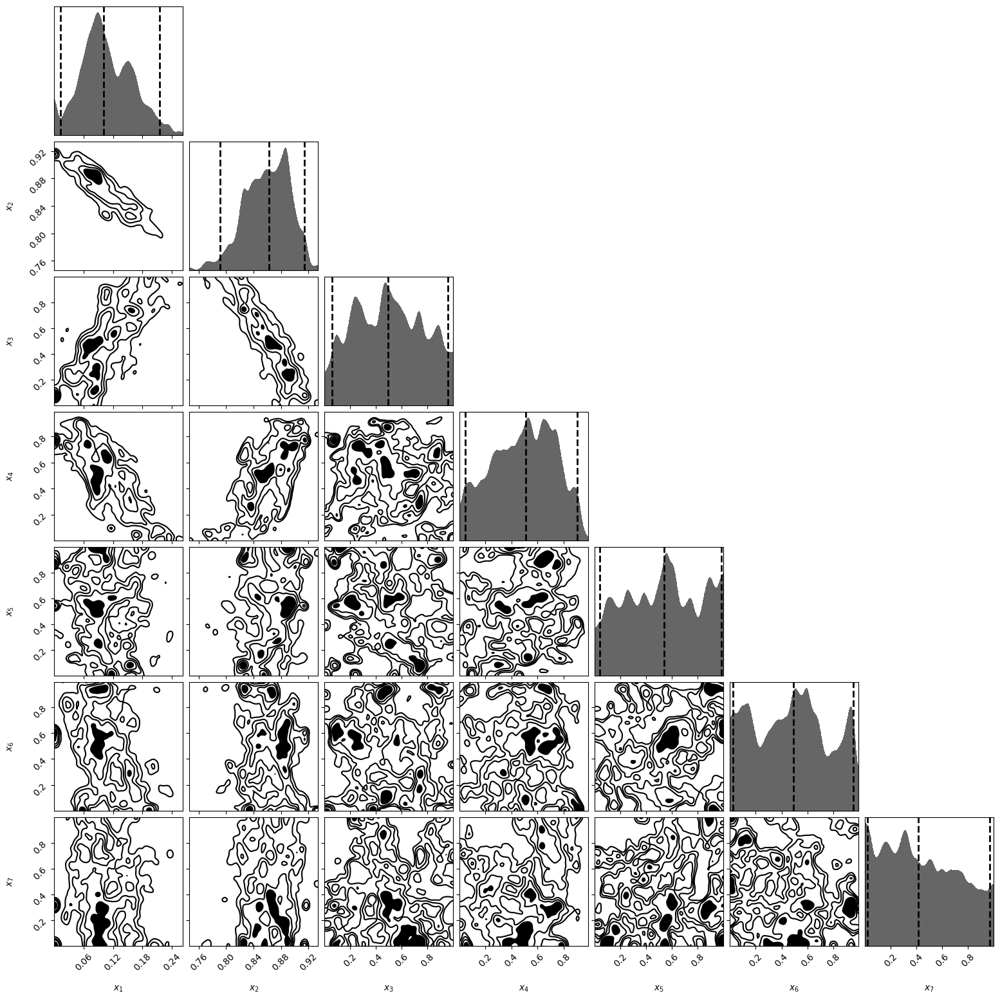

In [33]:
dyplot.cornerplot(ns.results);

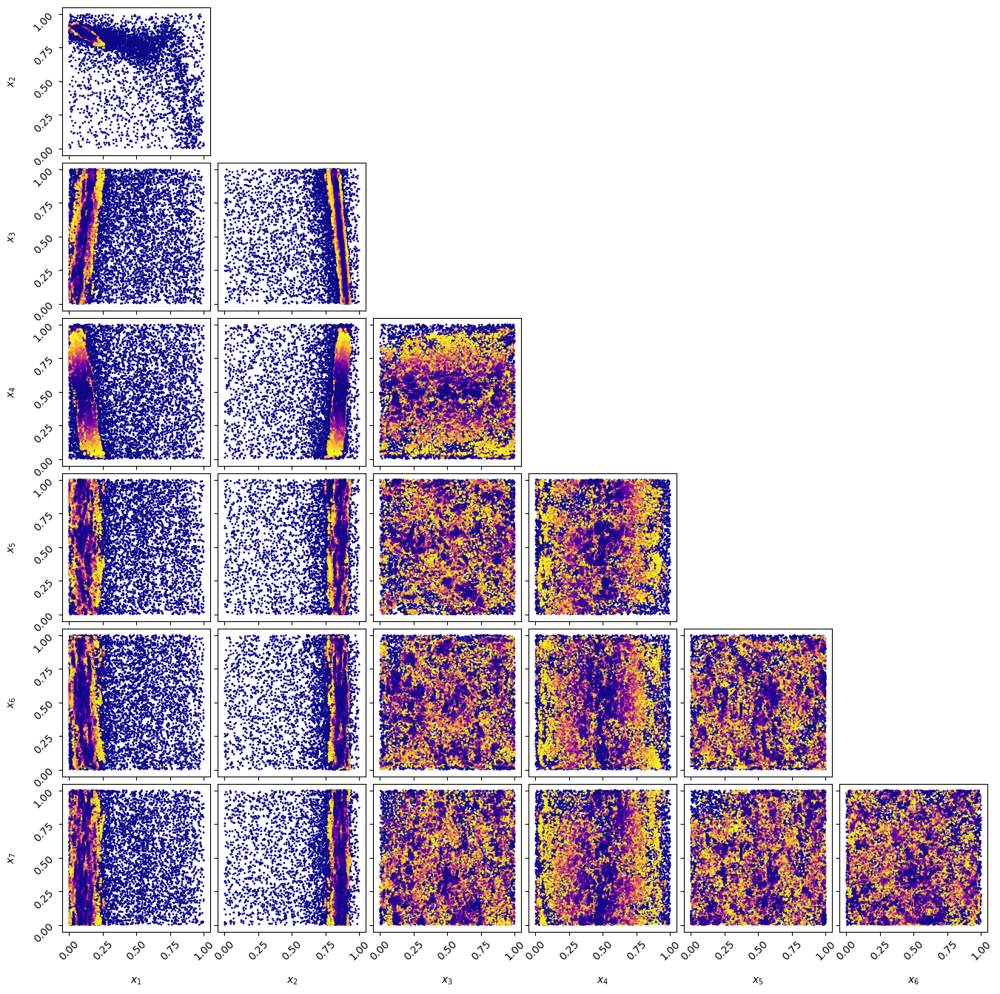

In [66]:
dyplot.cornerpoints(ns.results);

In [68]:
weighted_samples = dict(zip(base_names, ns.results.samples.T))

In [72]:
rng, key = random.split(rng)
predict = Predictive(reparam_model, weighted_samples)
weighted_posterior = predict(key, const)
mask = weighted_posterior["age"] < 14e9
weighted_posterior = {key: value[mask] for key, value in weighted_posterior.items()}

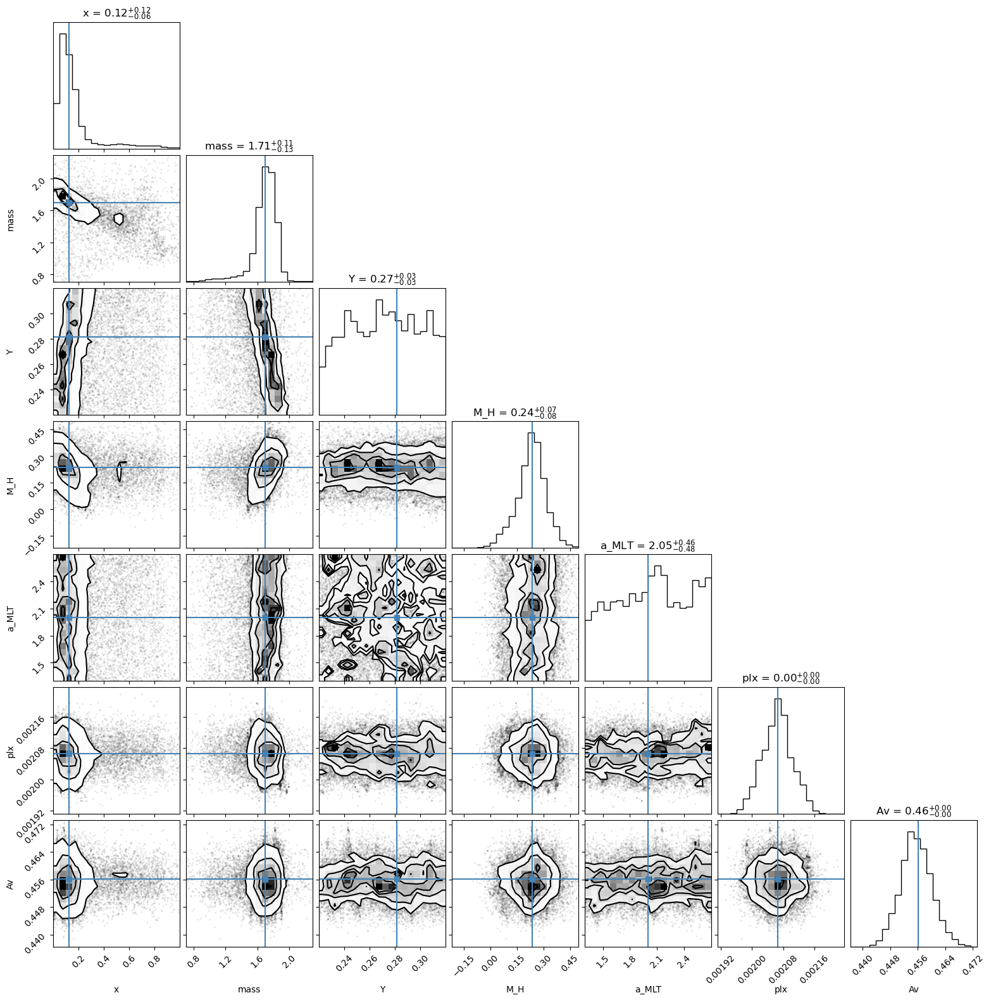

In [73]:
var_names=["x", "mass", "Y", "M_H", "a_MLT", "plx", "Av"]

fig = corner(
    weighted_posterior, 
    var_names=var_names, 
    truths={k: truths[k][i] for k in var_names},
    show_titles=True,
)

In [34]:
samples = ns.results.samples_equal()
samples = dict(zip(base_names, samples.T))

In [35]:
rng, key = random.split(rng)
predict = Predictive(reparam_model, samples)
posterior = predict(key, const)
mask = posterior["age"] < 14e9
posterior = {key: value[mask] for key, value in posterior.items()}

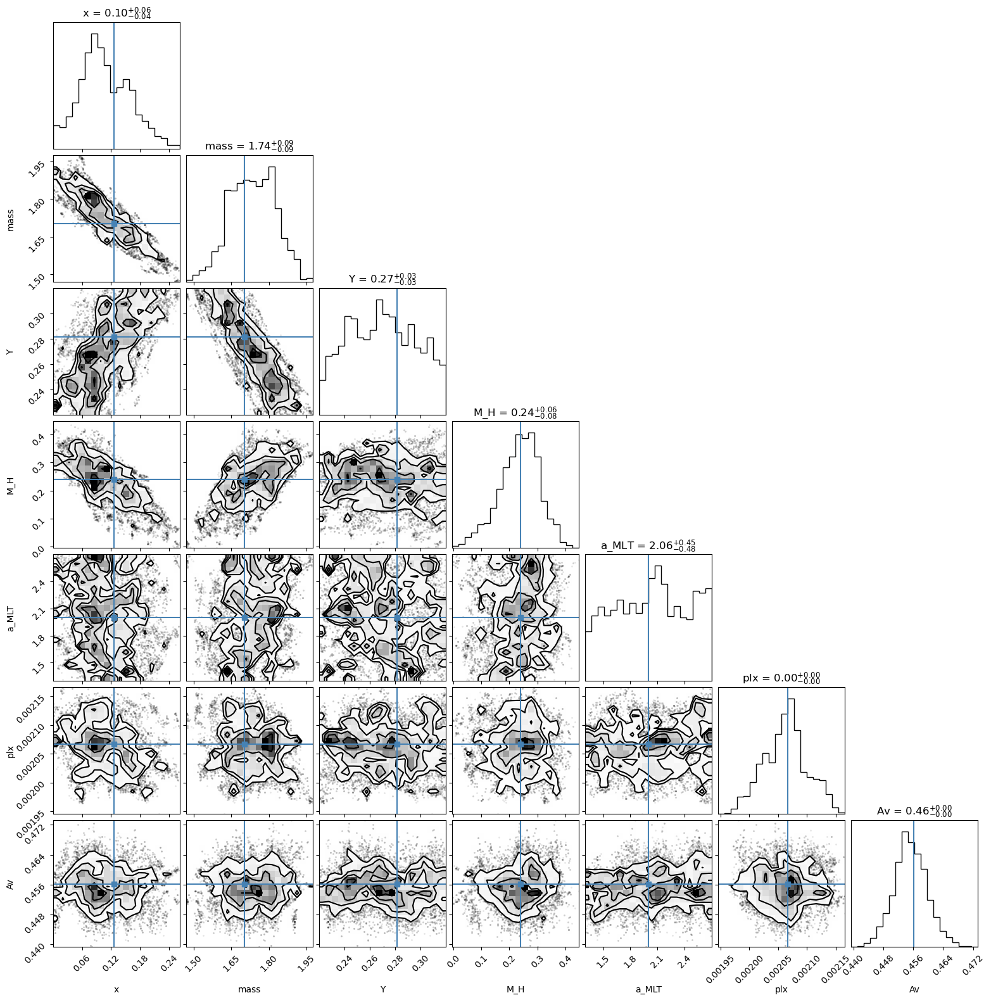

In [36]:
var_names=["x", "mass", "Y", "M_H", "a_MLT", "plx", "Av"]

fig = corner(
    posterior, 
    var_names=var_names, 
    truths={k: truths[k][i] for k in var_names},
    show_titles=True,
)

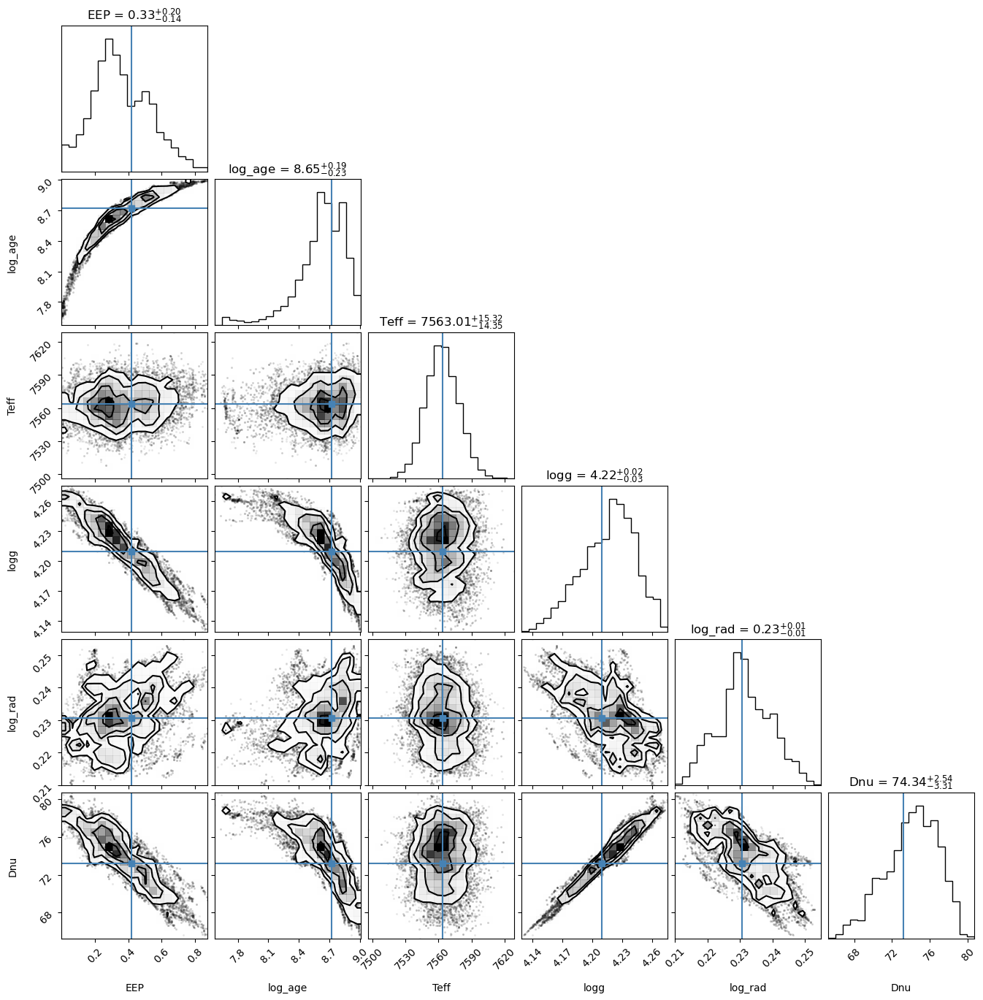

In [37]:
var_names = [
    "EEP", "log_age", "Teff", "logg", "log_rad", "Dnu"
]

fig = corner(
    posterior, 
    var_names=var_names, 
    truths={k: truths[k][i] for k in var_names},
    show_titles=True,
)

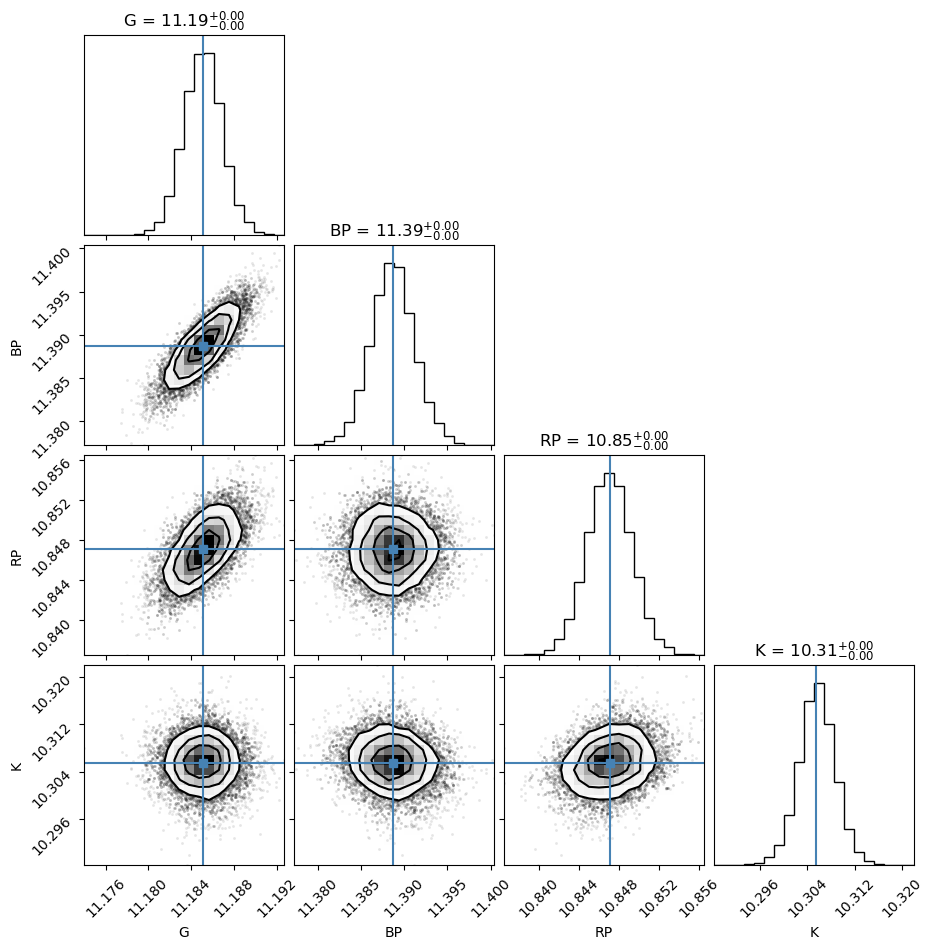

In [38]:
var_names = model.bands

fig = corner(
    posterior, 
    var_names=var_names, 
    truths={k: truths[k][i] for k in var_names},
    show_titles=True,
)

In [181]:
from warnings import warn
input_cols = ["EEP", "mass", "Y", "log_Z", "a_MLT"]
output_cols = ["log_age", "log_Teff", "log_rad", "log_Dnu", "logg"]
output_cols += model.bands

def make_grid(**inputs):
    xi = [np.atleast_1d(inputs.pop(i)) for i in input_cols]
    if len(inputs) > 0:
        warn(f"Unknown keyword arguments have been ignored: {', '.join(inputs.keys())}.")
    coords = np.stack(np.meshgrid(*xi, indexing='ij'), axis=-1)
    X = np.reshape(coords, (np.prod(coords.shape[:-1]), coords.shape[-1]))
    index = pd.MultiIndex.from_arrays(X.T, names=input_cols)
    y = model.emulator(X)
    logg = model.log_gravity(np.log10(X[:, 1]), y[:, 2])
    mh = model.metallicity(X[:, 2], 10**X[:, 3])
    av = np.ones_like(mh) * truths["Av"][i]
    bc = model.bc_interp(np.stack([10**y[:, 1], logg, mh, av], axis=-1))
    log_lum = model.log_luminosity(y[:, 1], y[:, 2])
    bol_mag = model.bolometric_magnitude(log_lum)
    abs_mag = model.absolute_magnitude(bol_mag[:, None], bc)
    mag = model.apparent_magnitude(abs_mag, truths["plx"][i])
    return pd.DataFrame(np.concatenate((y, logg[:, None], mag), 1), index=index, columns=output_cols)

In [182]:
EEP = np.linspace(*data.posterior.EEP.quantile([.1, .9]), 101)
mass = np.linspace(*data.posterior.mass.quantile([.1, .9]), 20)
grid = make_grid(
    EEP=EEP, 
    mass=mass,
    Y=data.posterior.Y.mean(),
    log_Z=np.log10(data.posterior.Z).mean(),
    a_MLT=data.posterior.a_MLT.mean(),
)
grid.head()

log_age  log_Teff   log_rad  \
EEP     mass     Y        log_Z     a_MLT                                    
1.32735 1.303198 0.307639 -2.053051 2.042911  9.291190  3.836970  0.253809   
        1.309510 0.307639 -2.053051 2.042911  9.285403  3.837830  0.256200   
        1.315821 0.307639 -2.053051 2.042911  9.279679  3.838691  0.258558   
        1.322133 0.307639 -2.053051 2.042911  9.273984  3.839556  0.260866   
        1.328444 0.307639 -2.053051 2.042911  9.268238  3.840436  0.263102   

                                               log_Dnu      logg          G  \
EEP     mass     Y        log_Z     a_MLT                                     
1.32735 1.303198 0.307639 -2.053051 2.042911  1.786632  4.047392  11.485268   
        1.309510 0.307639 -2.053051 2.042911  1.783694  4.044709  11.465190   
        1.315821 0.307639 -2.053051 2.042911  1.780814  4.042080  11.445263   
        1.322133 0.307639 -2.053051 2.042911  1.778027  4.039542  11.425557   
        1.328444 0.307639 -2.053051 2.042911  1.775350  4.037140  11.406073   

                                                     BP         RP          K  
EEP     mass     Y        log_Z     a_MLT                                      
1.32735 1.303198 0.307639 -2.053051 2.042911  11.752223  11.059998  10.309882  
        1.309510 0.307639 -2.053051 2.042911  11.730731  11.041772  10.295683  
        1.315821 0.307639 -2.053051 2.042911  11.709385  11.023704  10.281655  
        1.322133 0.307639 -2.053051 2.042911  11.688252  11.005868  10.267882  
        1.328444 0.307639 -2.053051 2.042911  11.667313  10.988288  10.254444

In [183]:
EEP = np.linspace(0.3, 1.0, 101)
mass = np.linspace(1.5, 1.8, 20)
grid = make_grid(
    EEP=EEP, 
    mass=mass,
    Y=truths["Y"][i],
    log_Z=np.log10(truths["Z"])[i],
    a_MLT=truths["a_MLT"][i],
)
mass = grid.index.get_level_values("mass")
grid.head()

log_age  log_Teff   log_rad   log_Dnu  \
EEP mass     Y        log_Z     a_MLT                                           
0.3 1.500000 0.281523 -1.660636 2.0    8.730845  3.839635  0.187816  1.916198   
    1.515789 0.281523 -1.660636 2.0    8.732160  3.842741  0.191417  1.910535   
    1.531579 0.281523 -1.660636 2.0    8.730604  3.845430  0.194912  1.905347   
    1.547368 0.281523 -1.660636 2.0    8.714636  3.848142  0.197780  1.901323   
    1.563158 0.281523 -1.660636 2.0    8.693444  3.851356  0.200239  1.898260   

                                           logg          G         BP  \
EEP mass     Y        log_Z     a_MLT                                   
0.3 1.500000 0.281523 -1.660636 2.0    4.240459  11.755231  12.023363   
    1.515789 0.281523 -1.660636 2.0    4.237804  11.708254  11.971055   
    1.531579 0.281523 -1.660636 2.0    4.235315  11.665735  11.923911   
    1.547368 0.281523 -1.660636 2.0    4.234033  11.626332  11.879962   
    1.563158 0.281523 -1.660636 2.0    4.233525  11.584365  11.832577   

                                              RP          K  
EEP mass     Y        log_Z     a_MLT                        
0.3 1.500000 0.281523 -1.660636 2.0    11.330751  10.615972  
    1.515789 0.281523 -1.660636 2.0    11.290421  10.590125  
    1.531579 0.281523 -1.660636 2.0    11.253696  10.565968  
    1.547368 0.281523 -1.660636 2.0    11.220129  10.544782  
    1.563158 0.281523 -1.660636 2.0    11.185112  10.524529

In [184]:
model.log_gravity(np.log10(grid.index.get_level_values("mass")), grid.log_rad)

EEP  mass      Y         log_Z      a_MLT
0.3  1.500000  0.281523  -1.660636  2.0      4.240459
     1.515789  0.281523  -1.660636  2.0      4.237804
     1.531579  0.281523  -1.660636  2.0      4.235315
     1.547368  0.281523  -1.660636  2.0      4.234033
     1.563158  0.281523  -1.660636  2.0      4.233525
                                               ...   
1.0  1.736842  0.281523  -1.660636  2.0      3.977105
     1.752632  0.281523  -1.660636  2.0      3.973434
     1.768421  0.281523  -1.660636  2.0      3.970302
     1.784211  0.281523  -1.660636  2.0      3.967854
     1.800000  0.281523  -1.660636  2.0      3.965538
Length: 2020, dtype: float64

In [185]:
EEP = np.linspace(1.0, 1.7, 101)
mass = np.linspace(1.2, 1.5, 20)
grid2 = make_grid(
    EEP=EEP, 
    mass=mass,
    Y=data.posterior.Y.median(),
    log_Z=np.log10(data.posterior.Z).median(),
    a_MLT=data.posterior.a_MLT.median(),
)
mass = grid2.index.get_level_values("mass")
grid2.head()

log_age  log_Teff   log_rad  \
EEP mass     Y      log_Z     a_MLT                                    
1.0 1.200000 0.3133 -2.091523 2.030844  9.208307  3.847367  0.149160   
    1.215789 0.3133 -2.091523 2.030844  9.197937  3.851088  0.153892   
    1.231579 0.3133 -2.091523 2.030844  9.186506  3.854585  0.158388   
    1.247368 0.3133 -2.091523 2.030844  9.174289  3.857963  0.162822   
    1.263158 0.3133 -2.091523 2.030844  9.161489  3.861365  0.167120   

                                         log_Dnu      logg          G  \
EEP mass     Y      log_Z     a_MLT                                     
1.0 1.200000 0.3133 -2.091523 2.030844  1.921065  4.220861  11.919397   
    1.215789 0.3133 -2.091523 2.030844  1.914917  4.217074  11.861088   
    1.231579 0.3133 -2.091523 2.030844  1.909217  4.213686  11.806056   
    1.247368 0.3133 -2.091523 2.030844  1.903751  4.210352  11.752454   
    1.263158 0.3133 -2.091523 2.030844  1.898659  4.207218  11.699509   

                                               BP         RP          K  
EEP mass     Y      log_Z     a_MLT                                      
1.0 1.200000 0.3133 -2.091523 2.030844  12.170371  11.513020  10.806686  
    1.215789 0.3133 -2.091523 2.030844  12.106040  11.462638  10.773717  
    1.231579 0.3133 -2.091523 2.030844  12.045297  11.415122  10.742713  
    1.247368 0.3133 -2.091523 2.030844  11.986129  11.368845  10.712523  
    1.263158 0.3133 -2.091523 2.030844  11.927691  11.323317  10.682796

In [186]:
from matplotlib.collections import LineCollection
from matplotlib.colors import BoundaryNorm, ListedColormap
import matplotlib.patches as mpatches

In [187]:
post_samples = mcmc.get_samples()

Text(0.5, 1.0, 'Y=0.31, M_H=-0.18, a=2.03 | Y=0.28, M_H=0.24, a=2.00')

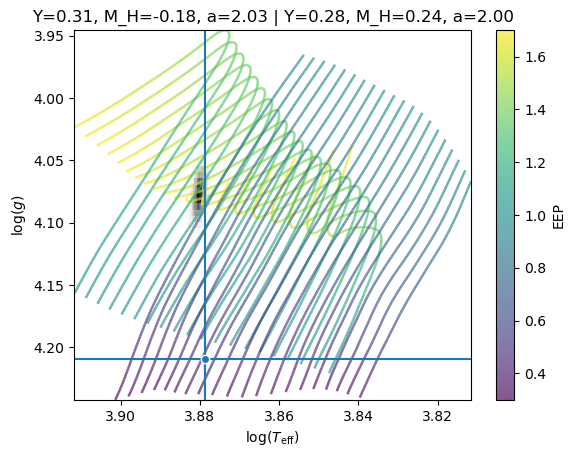

In [188]:
fig, ax = plt.subplots()

norm = plt.Normalize(grid.index.get_level_values("EEP").min(), grid2.index.get_level_values("EEP").max())

for name, group in grid2.groupby("mass"):
    points = np.array([group["log_Teff"], group["logg"]]).T.reshape(-1, 1, 2)
    segments = np.concatenate([points[:-1], points[1:]], axis=1)

    lc = LineCollection(segments, cmap='viridis', norm=norm, alpha=0.66)
    lc.set_array(group.index.get_level_values("EEP"))
    lc.set_linewidth(1.8)
    line = ax.add_collection(lc)

# Y, M_H, a = (truths["Y"][i], truths["M_H"][i], truths["a_MLT"][i])
# fig.colorbar(line, ax=ax, label=f"EEP ({Y=:.2f}, {M_H=:.2f}, {a=:.2f})")

# norm = plt.Normalize(grid.index.get_level_values("EEP").min(), grid.index.get_level_values("EEP").max())

for name, group in grid.groupby("mass"):
    points = np.array([group["log_Teff"], group["logg"]]).T.reshape(-1, 1, 2)
    segments = np.concatenate([points[:-1], points[1:]], axis=1)

    lc = LineCollection(segments, cmap='viridis', norm=norm, alpha=0.66)
    lc.set_array(group.index.get_level_values("EEP"))
    lc.set_linewidth(1.8)
    line = ax.add_collection(lc)

fig.colorbar(line, ax=ax, label=f"EEP")

ax.hist2d(np.log10(post_samples["Teff"]), post_samples["logg"], bins=50, cmap="gray_r")
mean = post_samples["Teff"].mean(), np.log10(post_samples["Teff"]).mean(), post_samples["logg"].mean()
std = post_samples["Teff"].std(), np.log10(post_samples["Teff"]).std(), post_samples["logg"].std()

# ax.errorbar(
#     *mean[1:], xerr=std[1], yerr=std[2],
#     fmt="k", capsize=3,
# )

ax.axvline(np.log10(truths["Teff"][i]))
ax.axhline(truths["logg"][i])
ax.plot(np.log10(truths["Teff"][i]), truths["logg"][i], "o", markeredgecolor="white")

# arr = mpatches.FancyArrowPatch((3.84, 3.98), (3.86, 3.925),
#                                arrowstyle='->', mutation_scale=20)
# ax.add_patch(arr)
# ax.annotate("mass", (.4, .1), xycoords=arr, ha='center', va='bottom')

ax.set_xlim(min(grid["log_Teff"].min(), grid2["log_Teff"].min()), max(grid["log_Teff"].max(), grid2["log_Teff"].max()))
ax.set_ylim(min(grid["logg"].min(), grid2["logg"].min()), max(grid["logg"].max(), grid2["logg"].max()))

ax.invert_xaxis()
ax.invert_yaxis()

ax.set_xlabel("$\log(T_\\mathrm{eff})$")
ax.set_ylabel("$\log(g)$")

Y, M_H, a = (data.posterior["Y"].median(), data.posterior["M_H"].median(), data.posterior["a_MLT"].median())
title = [f"{Y=:.2f}, {M_H=:.2f}, {a=:.2f}"]

Y, M_H, a = (truths["Y"][i], truths["M_H"][i], truths["a_MLT"][i])
title += [f"{Y=:.2f}, {M_H=:.2f}, {a=:.2f}"]
ax.set_title(" | ".join(title))

Text(0.5, 1.0, 'Y=0.31, M_H=-0.18, a=2.03 | Y=0.28, M_H=0.24, a=2.00')

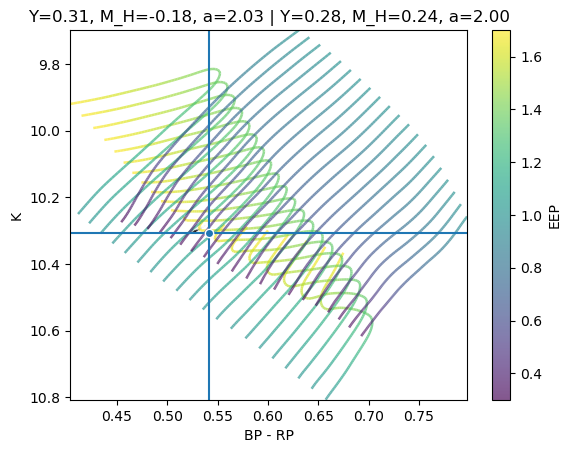

In [189]:
fig, ax = plt.subplots()

norm = plt.Normalize(grid.index.get_level_values("EEP").min(), grid2.index.get_level_values("EEP").max())

for name, group in grid2.groupby("mass"):
    points = np.array([group["BP"]-group["RP"], group["K"]]).T.reshape(-1, 1, 2)
    segments = np.concatenate([points[:-1], points[1:]], axis=1)

    lc = LineCollection(segments, cmap='viridis', norm=norm, alpha=0.66)
    lc.set_array(group.index.get_level_values("EEP"))
    lc.set_linewidth(1.8)
    line = ax.add_collection(lc)

# Y, M_H, a = (truths["Y"][i], truths["M_H"][i], truths["a_MLT"][i])
# fig.colorbar(line, ax=ax, label=f"EEP ({Y=:.2f}, {M_H=:.2f}, {a=:.2f})")

# norm = plt.Normalize(grid.index.get_level_values("EEP").min(), grid.index.get_level_values("EEP").max())

for name, group in grid.groupby("mass"):
    points = np.array([group["BP"]-group["RP"], group["K"]]).T.reshape(-1, 1, 2)
    segments = np.concatenate([points[:-1], points[1:]], axis=1)

    lc = LineCollection(segments, cmap='viridis', norm=norm, alpha=0.66)
    lc.set_array(group.index.get_level_values("EEP"))
    lc.set_linewidth(1.8)
    line = ax.add_collection(lc)

fig.colorbar(line, ax=ax, label=f"EEP")

ax.hist2d(post_samples["BP"]-post_samples["RP"], post_samples["K"], bins=50, cmap="gray_r")

ax.axvline(truths["BP"][i]-truths["RP"][i])
ax.axhline(truths["K"][i])
ax.plot(truths["BP"][i]-truths["RP"][i], truths["K"][i], "o", markeredgecolor="white")

# arr = mpatches.FancyArrowPatch((3.84, 3.98), (3.86, 3.925),
#                                arrowstyle='->', mutation_scale=20)
# ax.add_patch(arr)
# ax.annotate("mass", (.4, .1), xycoords=arr, ha='center', va='bottom')

ax.set_xlim(min((grid["BP"]-grid["RP"]).min(), (grid2["BP"]-grid2["RP"]).min()), 
            max((grid["BP"]-grid["RP"]).max(), (grid2["BP"]-grid2["RP"]).max()))
ax.set_ylim(min(grid["K"].min(), grid2["K"].min()), max(grid["K"].max(), grid2["K"].max()))

# ax.invert_xaxis()
ax.invert_yaxis()

ax.set_xlabel("BP - RP")
ax.set_ylabel("K")

Y, M_H, a = (data.posterior["Y"].median(), data.posterior["M_H"].median(), data.posterior["a_MLT"].median())
title = [f"{Y=:.2f}, {M_H=:.2f}, {a=:.2f}"]

Y, M_H, a = (truths["Y"][i], truths["M_H"][i], truths["a_MLT"][i])
title += [f"{Y=:.2f}, {M_H=:.2f}, {a=:.2f}"]
ax.set_title(" | ".join(title))

Text(0.5, 1.0, 'Y=0.31, M_H=-0.18, a=2.03 | Y=0.28, M_H=0.24, a=2.00')

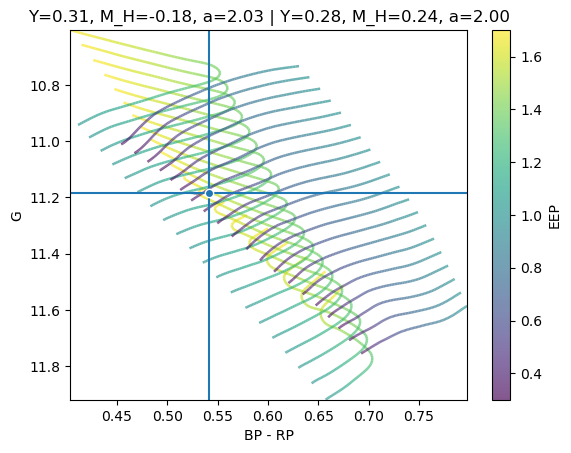

In [190]:
fig, ax = plt.subplots()

norm = plt.Normalize(grid.index.get_level_values("EEP").min(), grid2.index.get_level_values("EEP").max())

for name, group in grid2.groupby("mass"):
    points = np.array([group["BP"]-group["RP"], group["G"]]).T.reshape(-1, 1, 2)
    segments = np.concatenate([points[:-1], points[1:]], axis=1)

    lc = LineCollection(segments, cmap='viridis', norm=norm, alpha=0.66)
    lc.set_array(group.index.get_level_values("EEP"))
    lc.set_linewidth(1.8)
    line = ax.add_collection(lc)

# Y, M_H, a = (truths["Y"][i], truths["M_H"][i], truths["a_MLT"][i])
# fig.colorbar(line, ax=ax, label=f"EEP ({Y=:.2f}, {M_H=:.2f}, {a=:.2f})")

# norm = plt.Normalize(grid.index.get_level_values("EEP").min(), grid.index.get_level_values("EEP").max())

for name, group in grid.groupby("mass"):
    points = np.array([group["BP"]-group["RP"], group["G"]]).T.reshape(-1, 1, 2)
    segments = np.concatenate([points[:-1], points[1:]], axis=1)

    lc = LineCollection(segments, cmap='viridis', norm=norm, alpha=0.66)
    lc.set_array(group.index.get_level_values("EEP"))
    lc.set_linewidth(1.8)
    line = ax.add_collection(lc)

fig.colorbar(line, ax=ax, label=f"EEP")

ax.hist2d(post_samples["BP"]-post_samples["RP"], post_samples["G"], bins=50, cmap="gray_r")

ax.axvline(truths["BP"][i]-truths["RP"][i])
ax.axhline(truths["G"][i])
ax.plot(truths["BP"][i]-truths["RP"][i], truths["G"][i], "o", markeredgecolor="white")

# arr = mpatches.FancyArrowPatch((3.84, 3.98), (3.86, 3.925),
#                                arrowstyle='->', mutation_scale=20)
# ax.add_patch(arr)
# ax.annotate("mass", (.4, .1), xycoords=arr, ha='center', va='bottom')

ax.set_xlim(min((grid["BP"]-grid["RP"]).min(), (grid2["BP"]-grid2["RP"]).min()), 
            max((grid["BP"]-grid["RP"]).max(), (grid2["BP"]-grid2["RP"]).max()))
ax.set_ylim(min(grid["G"].min(), grid2["G"].min()), max(grid["G"].max(), grid2["G"].max()))

# ax.invert_xaxis()
ax.invert_yaxis()

ax.set_xlabel("BP - RP")
ax.set_ylabel("G")

Y, M_H, a = (data.posterior["Y"].median(), data.posterior["M_H"].median(), data.posterior["a_MLT"].median())
title = [f"{Y=:.2f}, {M_H=:.2f}, {a=:.2f}"]

Y, M_H, a = (truths["Y"][i], truths["M_H"][i], truths["a_MLT"][i])
title += [f"{Y=:.2f}, {M_H=:.2f}, {a=:.2f}"]
ax.set_title(" | ".join(title))

Text(0.5, 1.0, 'Y=0.31, M_H=-0.18, a=2.03 | Y=0.28, M_H=0.24, a=2.00')

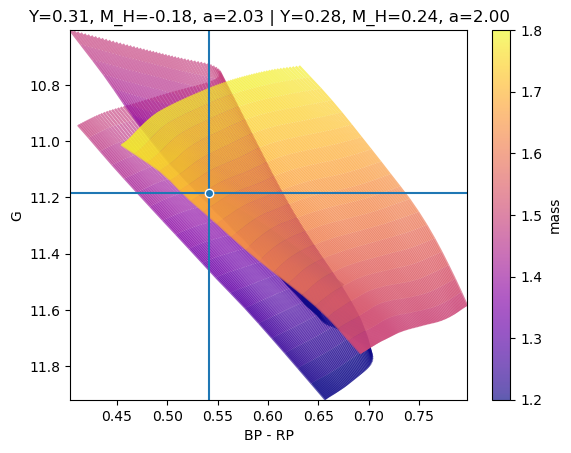

In [196]:
fig, ax = plt.subplots()

norm = plt.Normalize(grid2.index.get_level_values("mass").min(), grid.index.get_level_values("mass").max())

for name, group in grid2.groupby("EEP"):
    points = np.array([group["BP"]-group["RP"], group["G"]]).T.reshape(-1, 1, 2)
    segments = np.concatenate([points[:-1], points[1:]], axis=1)

    lc = LineCollection(segments, cmap='plasma', norm=norm, alpha=0.66)
    lc.set_array(group.index.get_level_values("mass"))
    lc.set_linewidth(1.8)
    line = ax.add_collection(lc)

# Y, M_H, a = (truths["Y"][i], truths["M_H"][i], truths["a_MLT"][i])
# fig.colorbar(line, ax=ax, label=f"EEP ({Y=:.2f}, {M_H=:.2f}, {a=:.2f})")

# norm = plt.Normalize(grid.index.get_level_values("EEP").min(), grid.index.get_level_values("EEP").max())

for name, group in grid.groupby("EEP"):
    points = np.array([group["BP"]-group["RP"], group["G"]]).T.reshape(-1, 1, 2)
    segments = np.concatenate([points[:-1], points[1:]], axis=1)

    lc = LineCollection(segments, cmap='plasma', norm=norm, alpha=0.66)
    lc.set_array(group.index.get_level_values("mass"))
    lc.set_linewidth(1.8)
    line = ax.add_collection(lc)

fig.colorbar(line, ax=ax, label=f"mass")

ax.hist2d(post_samples["BP"]-post_samples["RP"], post_samples["G"], bins=50, cmap="gray_r")

ax.axvline(truths["BP"][i]-truths["RP"][i])
ax.axhline(truths["G"][i])
ax.plot(truths["BP"][i]-truths["RP"][i], truths["G"][i], "o", markeredgecolor="white")

# arr = mpatches.FancyArrowPatch((3.84, 3.98), (3.86, 3.925),
#                                arrowstyle='->', mutation_scale=20)
# ax.add_patch(arr)
# ax.annotate("mass", (.4, .1), xycoords=arr, ha='center', va='bottom')

ax.set_xlim(min((grid["BP"]-grid["RP"]).min(), (grid2["BP"]-grid2["RP"]).min()), 
            max((grid["BP"]-grid["RP"]).max(), (grid2["BP"]-grid2["RP"]).max()))
ax.set_ylim(min(grid["G"].min(), grid2["G"].min()), max(grid["G"].max(), grid2["G"].max()))

# ax.invert_xaxis()
ax.invert_yaxis()

ax.set_xlabel("BP - RP")
ax.set_ylabel("G")

Y, M_H, a = (data.posterior["Y"].median(), data.posterior["M_H"].median(), data.posterior["a_MLT"].median())
title = [f"{Y=:.2f}, {M_H=:.2f}, {a=:.2f}"]

Y, M_H, a = (truths["Y"][i], truths["M_H"][i], truths["a_MLT"][i])
title += [f"{Y=:.2f}, {M_H=:.2f}, {a=:.2f}"]
ax.set_title(" | ".join(title))

Text(0.5, 1.0, 'Y=0.31, M_H=-0.18, a=2.03 | Y=0.28, M_H=0.24, a=2.00')

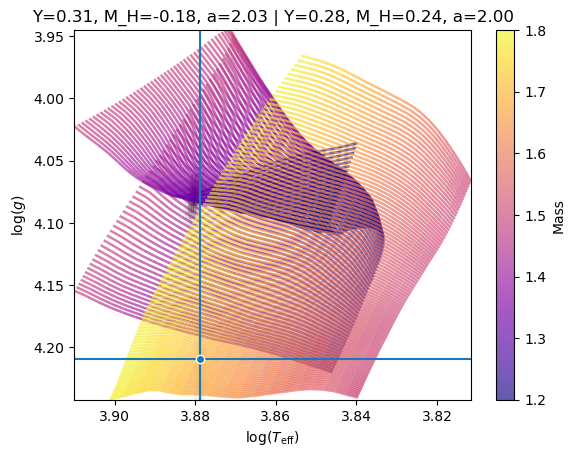

In [52]:
fig, ax = plt.subplots()

norm = plt.Normalize(grid2.index.get_level_values("mass").min(), grid.index.get_level_values("mass").max())

for name, group in grid2.groupby("EEP"):
    points = np.array([group["log_Teff"], group["logg"]]).T.reshape(-1, 1, 2)
    segments = np.concatenate([points[:-1], points[1:]], axis=1)

    lc = LineCollection(segments, cmap='plasma', norm=norm, alpha=0.66)
    lc.set_array(group.index.get_level_values("mass"))
    lc.set_linewidth(1.8)
    line = ax.add_collection(lc)

for name, group in grid.groupby("EEP"):
    points = np.array([group["log_Teff"], group["logg"]]).T.reshape(-1, 1, 2)
    segments = np.concatenate([points[:-1], points[1:]], axis=1)

    lc = LineCollection(segments, cmap='plasma', norm=norm, alpha=0.66)
    lc.set_array(group.index.get_level_values("mass"))
    lc.set_linewidth(1.8)
    line = ax.add_collection(lc)

fig.colorbar(line, ax=ax, label=f"Mass")

ax.hist2d(np.log10(post_samples["Teff"]), post_samples["logg"], bins=50, cmap="gray_r")
mean = post_samples["Teff"].mean(), np.log10(post_samples["Teff"]).mean(), post_samples["logg"].mean()
std = post_samples["Teff"].std(), np.log10(post_samples["Teff"]).std(), post_samples["logg"].std()

# ax.errorbar(
#     *mean[1:], xerr=std[1], yerr=std[2],
#     fmt="k", capsize=3,
# )

ax.axvline(np.log10(truths["Teff"][i]))
ax.axhline(truths["logg"][i])
ax.plot(np.log10(truths["Teff"][i]), truths["logg"][i], "o", markeredgecolor="white")

# arr = mpatches.FancyArrowPatch((3.84, 3.98), (3.86, 3.925),
#                                arrowstyle='->', mutation_scale=20)
# ax.add_patch(arr)
# ax.annotate("mass", (.4, .1), xycoords=arr, ha='center', va='bottom')

ax.set_xlim(min(grid["log_Teff"].min(), grid2["log_Teff"].min()), max(grid["log_Teff"].max(), grid2["log_Teff"].max()))
ax.set_ylim(min(grid["logg"].min(), grid2["logg"].min()), max(grid["logg"].max(), grid2["logg"].max()))

ax.invert_xaxis()
ax.invert_yaxis()

ax.set_xlabel("$\log(T_\\mathrm{eff})$")
ax.set_ylabel("$\log(g)$")

Y, M_H, a = (data.posterior["Y"].median(), data.posterior["M_H"].median(), data.posterior["a_MLT"].median())
title = [f"{Y=:.2f}, {M_H=:.2f}, {a=:.2f}"]

Y, M_H, a = (truths["Y"][i], truths["M_H"][i], truths["a_MLT"][i])
title += [f"{Y=:.2f}, {M_H=:.2f}, {a=:.2f}"]
ax.set_title(" | ".join(title))

In [220]:
import seaborn as sns
from jax.tree_util import tree_map

In [230]:
for key in param_names:
    if isinstance(trace[key]["fn"].support, dist.constraints.interval):
        print(key, trace[key]["fn"].low, trace[key]["fn"].high)

x 0.0 0.999
ln_mass -0.35667494393873245 0.8329091229351039
Y 0.22 0.32
M_H -0.9 0.5
a_MLT 1.3 2.7


In [243]:
num_test = 10000
test_params = {
    "Av": np.broadcast_to(truths["Av"][i], (num_test,)),
    "plx": np.broadcast_to(truths["plx"][i], (num_test,)),
    "x": np.random.uniform(0.0, 0.999, size=(num_test,)),
    "ln_mass": np.random.uniform(-0.356, 0.832, size=(num_test,)),
    "Y": np.random.uniform(0.22, 0.32, size=(num_test,)),
    "a_MLT": np.random.uniform(1.3, 2.7, size=(num_test,)),
    "M_H": np.random.uniform(-0.9, 0.5, size=(num_test,)),
}

log_prob = vmap(lambda x: log_density(model, (const, obs), {}, x)[0])(test_params)

In [244]:
# rng, key = random.split(rng)
# predict = Predictive(reparam_model, dict(zip(base_names, x.T)))
# test = predict(key, const, obs)

In [245]:
df = pd.DataFrame(test_params)
df["log_prob"] = log_prob
df.head()

,Av,plx,x,ln_mass,Y,a_MLT,M_H,log_prob
0,0.456163,0.002066,0.173429,0.106114,0.260451,1.965264,0.206021,-196.392950
1,0.456163,0.002066,0.767977,0.158037,0.306960,1.970921,-0.575676,-150.377463
2,0.456163,0.002066,0.438335,0.002088,0.306483,1.544305,-0.607116,-195.238799
3,0.456163,0.002066,0.954042,0.380459,0.245391,1.445470,0.165252,-181.649451
4,0.456163,0.002066,0.228876,0.565619,0.254182,1.460531,-0.638745,-154.603028


In [250]:
norm = plt.Normalize(log_prob.min(), log_prob.max())
sm = plt.cm.ScalarMappable(cmap="viridis", norm=norm)

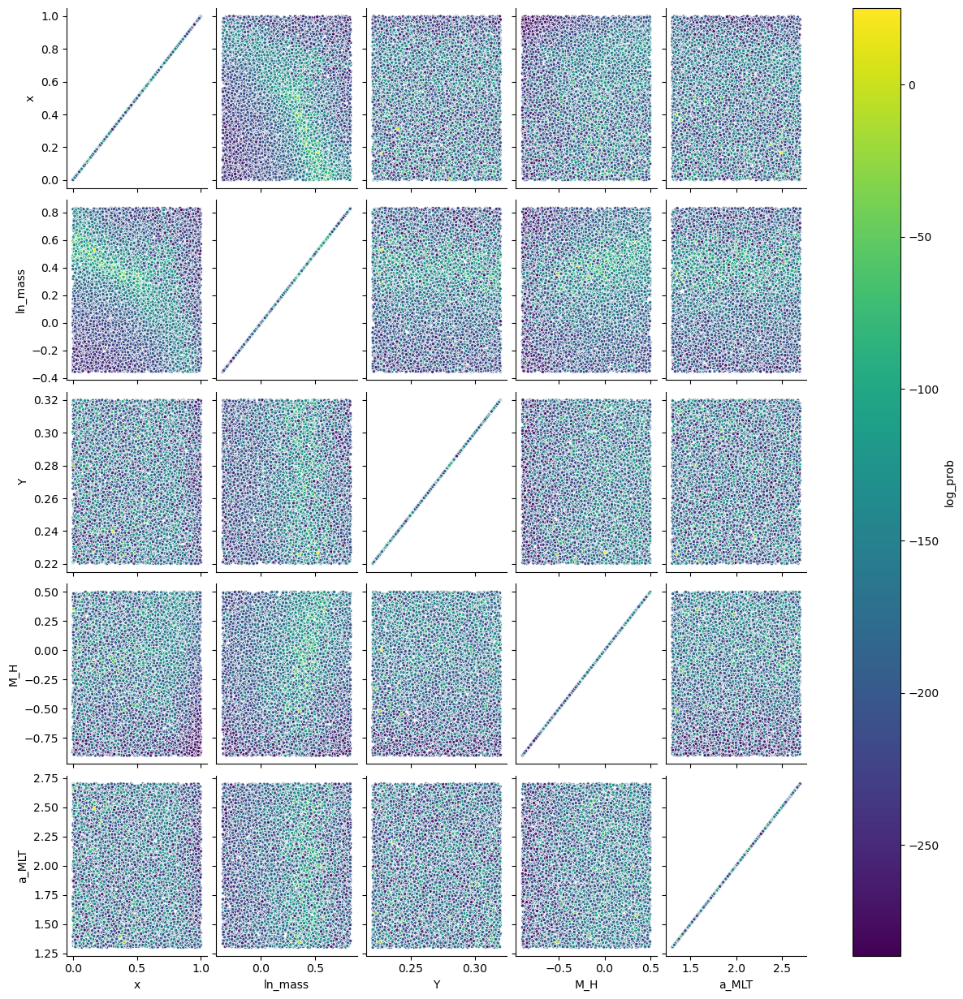

In [251]:
pg = sns.pairplot(df, vars=["x", "ln_mass", "Y", "M_H", "a_MLT"],
             diag_kind=None, markers='.', plot_kws={"c": log_prob, "norm": norm})

cbar = plt.colorbar(sm, ax=pg.axes, label="log_prob")

In [196]:
quantiles = data.posterior[param_names].quantile([.001, .999])

In [197]:
test_params = {key: np.random.uniform(*value, size=(num_test,)) for key, value in quantiles.items()}

In [198]:
log_prob = vmap(lambda x: log_density(model, (const, obs), {}, x)[0])(test_params)

In [199]:
df = pd.DataFrame(test_params)
df["log_prob"] = log_prob
df.head()

,x,ln_mass,Y,M_H,a_MLT,plx,Av,log_prob
0,0.483098,0.271171,0.282450,-0.170794,2.032250,0.002064,0.456050,-82.165440
1,0.520694,0.278940,0.307656,-0.226822,2.243365,0.002114,0.466178,-92.298257
2,0.524856,0.268372,0.299331,-0.215023,1.475833,0.002041,0.466291,-32.471790
3,0.490458,0.332825,0.312904,-0.288892,1.864942,0.002010,0.445719,-104.703584
4,0.524611,0.248897,0.313712,-0.133385,1.615804,0.002034,0.459045,-73.671550


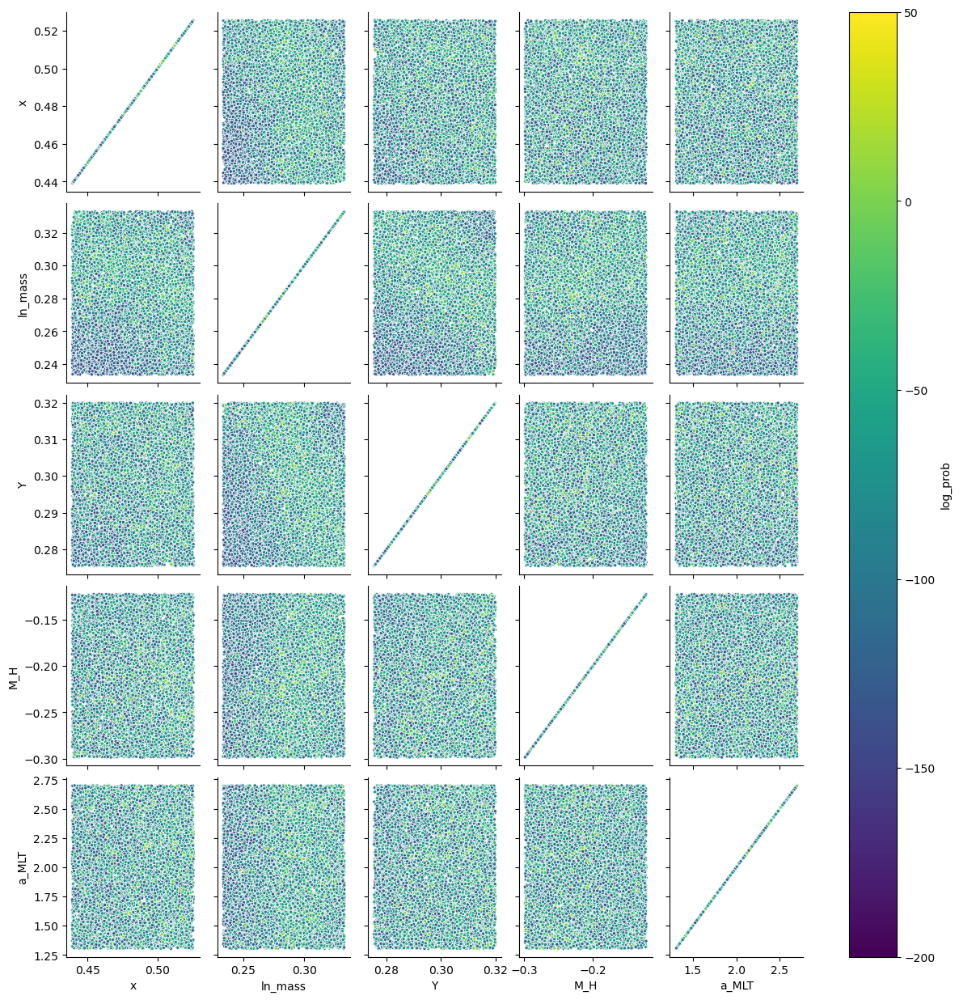

In [200]:
pg = sns.pairplot(df, vars=["x", "ln_mass", "Y", "M_H", "a_MLT"],
             diag_kind=None, markers='.', plot_kws={"c": log_prob, "norm": norm});

cbar = plt.colorbar(sm, ax=pg.axes, label="log_prob")

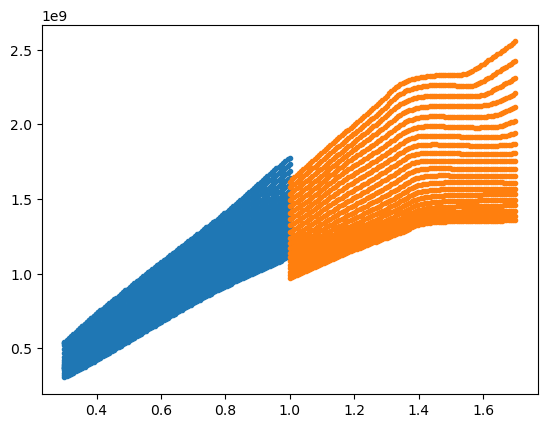

In [205]:
plt.plot(grid.index.get_level_values("EEP"), 10**grid.log_age, ".");
plt.plot(grid2.index.get_level_values("EEP"), 10**grid2.log_age, ".");

This is a problem. The hook happens very rapidly. This means our prior is wrong to give uniform likelihood in EEP. Since it's less likeliy to find a star in the hook. How do we impose an age prior?